# Imports & Globals

In [ ]:
import os
from tqdm import tqdm
from datetime import datetime
import json
from contextlib import nullcontext

import numpy as np

import torch
from torch.utils.data import DataLoader
import torchvision.transforms.functional as F
from torchvision import transforms
from torch.optim import AdamW
from torchvision.utils import make_grid

from scripts.utils import create_missing_dirs
from scripts.dataset.dataset import CustomDataset
from scripts.diffusion_utils import DiffusionManager
from scripts.unet_openai import UNetModel

import matplotlib.pyplot as plt


In [2]:
CONFIG_PTH = "configs/afhq.json"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parse config

In [3]:
with open(CONFIG_PTH) as f:
    config = json.load(f)

In [4]:
hyperparams = config["hyperparams"]
data_dir = config["data_dir"]
model_params = config["model"]

In [5]:
print(f"Using v prediction? {hyperparams["v_prediction"]}")

Using v prediction? True


# Dataset & Dataloader

In [6]:
# Instantiate dataset and dataloader
dataset = CustomDataset(data_dir)
dataloader = DataLoader(
    dataset,
    batch_size=hyperparams["batch_size"],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

Looking for data...


1it [00:00, 102.62it/s]

Done!


In [7]:
# Helper to show grid of dataset items
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    _, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = (img+1)/2 # Back to [0,1] range
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.title("Dataset samples")
    plt.axis("off")

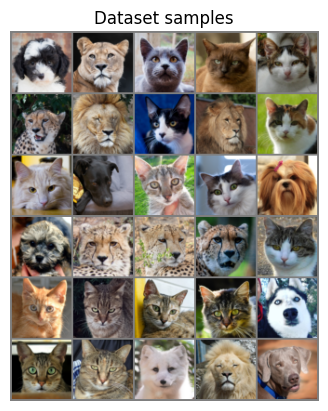

In [8]:
# Show grid of dataset items
imgs = [dataset.__getitem__(idx) for idx in range(30)]
grid = make_grid(imgs, nrow=5)
show(grid)


# Diffusion Manager

In [9]:
diffusion_manager = DiffusionManager(
    num_steps=hyperparams["num_steps"],
    beta_start=hyperparams["beta_start"],
    beta_end=hyperparams["beta_end"],
    beta_schedule=hyperparams["scheduler_mode"],
    training_method="v_prediction" if hyperparams["v_prediction"] else "noise",
)

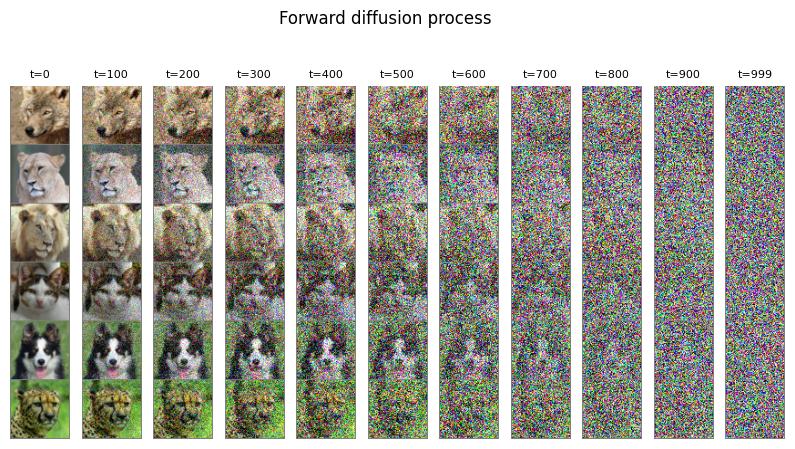

In [10]:
# Demo noise scheduler
batch = next(iter(dataloader))[:6]
per_step_noisy_batch = []
timesteps = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 999]

for step in timesteps:
    noise = torch.randn_like(batch)
    t_step = torch.ones((batch.shape[0],), dtype=torch.int) * step
    noisy_batch = diffusion_manager.forward_process(batch, t_step, noise)
    noisy_batch = make_grid(noisy_batch, nrow=1, padding=1)
    per_step_noisy_batch.append(noisy_batch)

_, ax = plt.subplots(1, len(per_step_noisy_batch), figsize=(10, 5), facecolor="white")
for i, (step, noisy_sample) in enumerate(zip(timesteps, per_step_noisy_batch)):
    img = (noisy_sample.squeeze(0).permute(1, 2, 0) + 1) / 2  # Back to [0,1] range
    img = np.clip(img.numpy(), 0, 1)
    ax[i].imshow(img)
    ax[i].set_title(f"t={step}", fontsize=8)
    ax[i].axis("off")
    ax[i].grid(False)

plt.suptitle("Forward diffusion process", y=1)
plt.axis("off")
plt.show()

# Model

In [11]:
# Following the procedure in https://github.com/VSehwag/minimal-diffusion/blob/main/unets.py
attention_ds = []
attention_resolutions = model_params["attention_resolutions"]
for res in attention_resolutions.split(","):
    attention_ds.append(model_params["img_size"] // int(res))

In [12]:
model = UNetModel(
    image_size=model_params["img_size"],
    in_channels=model_params["in_channels"],
    model_channels=model_params["base_width"],
    out_channels=model_params["in_channels"],
    num_res_blocks=3,
    attention_resolutions=tuple(attention_ds),
    dropout=0.1,
    channel_mult=model_params["channel_mult"],
    num_classes=None,
    use_checkpoint=False,
    use_fp16=False,
    num_heads=4,
    num_head_channels=64,
    num_heads_upsample=-1,
    use_scale_shift_norm=True,
    resblock_updown=True,
    use_new_attention_order=True,
).to(DEVICE)
model.train()

UNetModel(
  (time_embed): Sequential(
    (0): Linear(in_features=64, out_features=256, bias=True)
    (1): SiLU()
    (2): Linear(in_features=256, out_features=256, bias=True)
  )
  (input_blocks): ModuleList(
    (0): TimestepEmbedSequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1-3): 3 x TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 64, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Identity()
        (x_upd): Identity()
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=256, out_features=128, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 64, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.1, inplace=False)
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride

In [13]:
initial_weights = config["initial_weights"]
if os.path.isfile(initial_weights):
    print(f"Initializing model with weights {initial_weights}")
    model.load_state_dict(torch.load(initial_weights))

# Optimizer

In [14]:
optimizer = AdamW(model.parameters(), lr=hyperparams["lr"])

# Loss function

In [15]:
criterion = torch.nn.MSELoss()

# Image sampler

In [16]:
@torch.no_grad()
def sample(model, config):
    """
    Starting from a normal distribution with mean 0 and variance 1, denoise progressively
    until we get an image that could belong to the pdf representing the training
    data.
    """
    noise = torch.randn(
        (
            config["sampling"]["num_samples"],
            model_params["in_channels"],
            model_params["img_size"],
            model_params["img_size"],
        )
    ).to(DEVICE)
    

    imgs = diffusion_manager.sample(model, noise)
    
    # Show denoised samples
    ims = torch.clamp(imgs[-1], -1.0, 1.0).detach().cpu()
    ims = (ims + 1) / 2
    grid = make_grid(ims, nrow=config["sampling"]["num_grid_rows"])
    img = transforms.ToPILImage()(grid)
    img = img.resize(( int(img.width * 2), int(img.height * 2)))
    display(img)


# Training Cycle

In [17]:
torch.autograd.set_detect_anomaly(True)
avg_epoch_losses = []
scaler = torch.amp.GradScaler("cuda")

Running epoch 0


100%|██████████| 448/448 [06:43<00:00,  1.11it/s]


Finished epoch 0 with loss 0.1914773579088173
Running epoch 1


100%|██████████| 448/448 [06:46<00:00,  1.10it/s]


Finished epoch 1 with loss 0.10176372464879282
Running epoch 2


100%|██████████| 448/448 [06:15<00:00,  1.19it/s]


Finished epoch 2 with loss 0.09412075760441699
Running epoch 3


100%|██████████| 448/448 [06:14<00:00,  1.20it/s]


Finished epoch 3 with loss 0.08949998046071934
Running epoch 4


100%|██████████| 448/448 [06:05<00:00,  1.23it/s]


Finished epoch 4 with loss 0.08590339997317642
Running epoch 5


100%|██████████| 448/448 [06:05<00:00,  1.23it/s]


Finished epoch 5 with loss 0.08484382674630199
Running epoch 6


100%|██████████| 448/448 [06:05<00:00,  1.23it/s]


Finished epoch 6 with loss 0.08430903865623154
Running epoch 7


100%|██████████| 448/448 [06:10<00:00,  1.21it/s]


Finished epoch 7 with loss 0.08132335520349443
Running epoch 8


100%|██████████| 448/448 [07:33<00:00,  1.01s/it]


Finished epoch 8 with loss 0.08137368827426274
Running epoch 9


100%|██████████| 448/448 [07:22<00:00,  1.01it/s]


Finished epoch 9 with loss 0.07996290356719069


1000it [01:15, 13.20it/s]


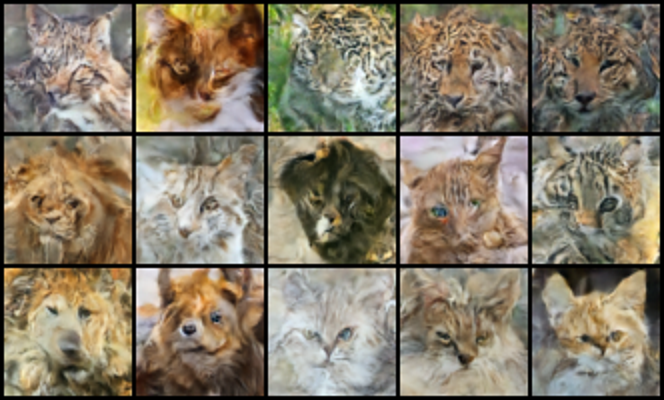

Running epoch 10


100%|██████████| 448/448 [06:28<00:00,  1.15it/s]


Finished epoch 10 with loss 0.07977195621268558
Running epoch 11


100%|██████████| 448/448 [06:29<00:00,  1.15it/s]


Finished epoch 11 with loss 0.08070722996490076
Running epoch 12


100%|██████████| 448/448 [06:28<00:00,  1.15it/s]


Finished epoch 12 with loss 0.07996622751566715
Running epoch 13


100%|██████████| 448/448 [06:28<00:00,  1.15it/s]


Finished epoch 13 with loss 0.07849359543927546
Running epoch 14


100%|██████████| 448/448 [06:29<00:00,  1.15it/s]


Finished epoch 14 with loss 0.07817696157144383
Running epoch 15


100%|██████████| 448/448 [06:17<00:00,  1.19it/s]


Finished epoch 15 with loss 0.07820996505740498
Running epoch 16


100%|██████████| 448/448 [06:22<00:00,  1.17it/s]


Finished epoch 16 with loss 0.07838836512694668
Running epoch 17


100%|██████████| 448/448 [06:28<00:00,  1.15it/s]


Finished epoch 17 with loss 0.07744741996118266
Running epoch 18


100%|██████████| 448/448 [06:31<00:00,  1.15it/s]


Finished epoch 18 with loss 0.07731283342997942
Running epoch 19


100%|██████████| 448/448 [06:32<00:00,  1.14it/s]


Finished epoch 19 with loss 0.07763222970866732


1000it [01:17, 12.95it/s]


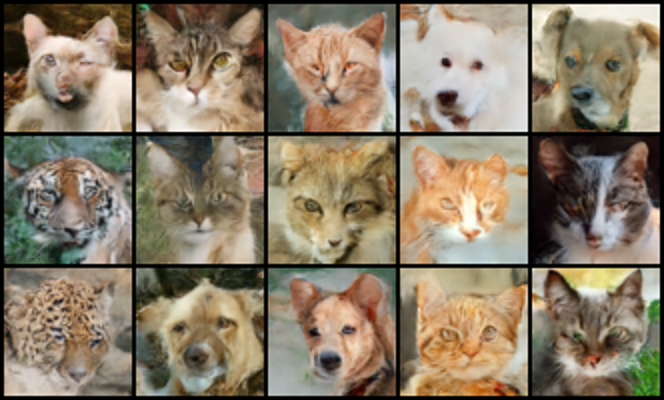

Running epoch 20


100%|██████████| 448/448 [06:38<00:00,  1.12it/s]


Finished epoch 20 with loss 0.07763392973824271
Running epoch 21


100%|██████████| 448/448 [06:38<00:00,  1.12it/s]


Finished epoch 21 with loss 0.07572670204431883
Running epoch 22


100%|██████████| 448/448 [06:46<00:00,  1.10it/s]


Finished epoch 22 with loss 0.07646503247087821
Running epoch 23


100%|██████████| 448/448 [06:38<00:00,  1.12it/s]


Finished epoch 23 with loss 0.0768156283967463
Running epoch 24


100%|██████████| 448/448 [06:38<00:00,  1.13it/s]


Finished epoch 24 with loss 0.07560429553268477
Running epoch 25


100%|██████████| 448/448 [06:38<00:00,  1.13it/s]


Finished epoch 25 with loss 0.07503688623962392
Running epoch 26


100%|██████████| 448/448 [06:37<00:00,  1.13it/s]


Finished epoch 26 with loss 0.07537411222334153
Running epoch 27


100%|██████████| 448/448 [06:39<00:00,  1.12it/s]


Finished epoch 27 with loss 0.07515764635588441
Running epoch 28


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 28 with loss 0.07598701639965709
Running epoch 29


100%|██████████| 448/448 [06:06<00:00,  1.22it/s]


Finished epoch 29 with loss 0.07580925394514841


1000it [01:13, 13.69it/s]


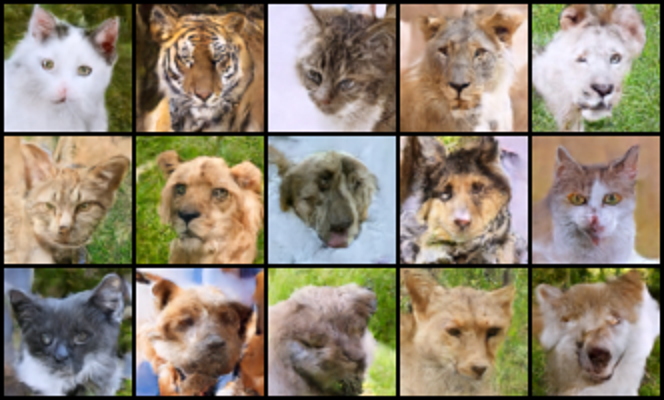

Running epoch 30


100%|██████████| 448/448 [06:12<00:00,  1.20it/s]


Finished epoch 30 with loss 0.07484543103990811
Running epoch 31


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 31 with loss 0.07486697609835703
Running epoch 32


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 32 with loss 0.07442712210052248
Running epoch 33


100%|██████████| 448/448 [06:08<00:00,  1.21it/s]


Finished epoch 33 with loss 0.0740366921610465
Running epoch 34


100%|██████████| 448/448 [06:08<00:00,  1.22it/s]


Finished epoch 34 with loss 0.07367798231176234
Running epoch 35


100%|██████████| 448/448 [06:12<00:00,  1.20it/s]


Finished epoch 35 with loss 0.07425178564985149
Running epoch 36


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 36 with loss 0.0741458425514533
Running epoch 37


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 37 with loss 0.07446636916470847
Running epoch 38


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 38 with loss 0.07482007203257776
Running epoch 39


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 39 with loss 0.07378690065317121


1000it [01:11, 14.06it/s]


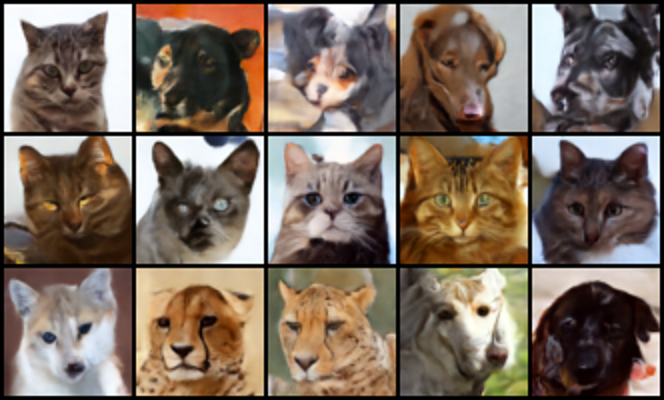

Running epoch 40


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 40 with loss 0.07453045954129525
Running epoch 41


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 41 with loss 0.074282323101735
Running epoch 42


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 42 with loss 0.07315025904348918
Running epoch 43


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 43 with loss 0.07318782782281882
Running epoch 44


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 44 with loss 0.07384617715641591
Running epoch 45


100%|██████████| 448/448 [06:31<00:00,  1.14it/s]


Finished epoch 45 with loss 0.07340954070345365
Running epoch 46


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 46 with loss 0.07380687655781262
Running epoch 47


100%|██████████| 448/448 [07:47<00:00,  1.04s/it]


Finished epoch 47 with loss 0.0737684096342751
Running epoch 48


100%|██████████| 448/448 [08:25<00:00,  1.13s/it]


Finished epoch 48 with loss 0.07364023379549119
Running epoch 49


100%|██████████| 448/448 [07:10<00:00,  1.04it/s]


Finished epoch 49 with loss 0.07347391160770453


1000it [01:19, 12.56it/s]


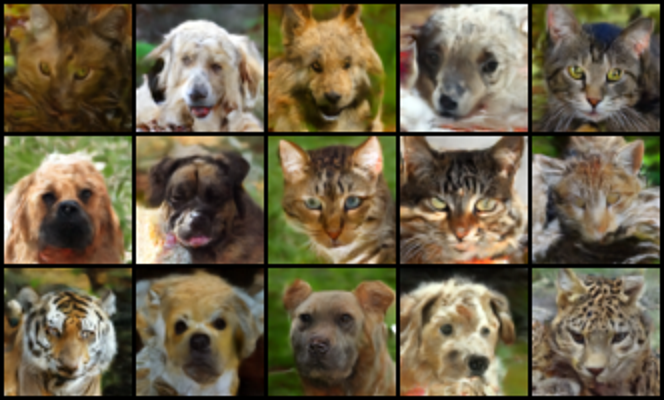

Running epoch 50


100%|██████████| 448/448 [06:42<00:00,  1.11it/s]


Finished epoch 50 with loss 0.07280339111873348
Running epoch 51


100%|██████████| 448/448 [06:47<00:00,  1.10it/s]


Finished epoch 51 with loss 0.07353139938121396
Running epoch 52


100%|██████████| 448/448 [06:38<00:00,  1.12it/s]


Finished epoch 52 with loss 0.0727240533285242
Running epoch 53


100%|██████████| 448/448 [06:21<00:00,  1.18it/s]


Finished epoch 53 with loss 0.07249161677568086
Running epoch 54


100%|██████████| 448/448 [06:25<00:00,  1.16it/s]


Finished epoch 54 with loss 0.07274057735256585
Running epoch 55


100%|██████████| 448/448 [06:47<00:00,  1.10it/s]


Finished epoch 55 with loss 0.07281352361730699
Running epoch 56


100%|██████████| 448/448 [07:34<00:00,  1.01s/it]


Finished epoch 56 with loss 0.07288610837089696
Running epoch 57


100%|██████████| 448/448 [06:42<00:00,  1.11it/s]


Finished epoch 57 with loss 0.07338856585556641
Running epoch 58


100%|██████████| 448/448 [06:37<00:00,  1.13it/s]


Finished epoch 58 with loss 0.07236766389438085
Running epoch 59


100%|██████████| 448/448 [06:36<00:00,  1.13it/s]


Finished epoch 59 with loss 0.07307377686291668


1000it [01:18, 12.81it/s]


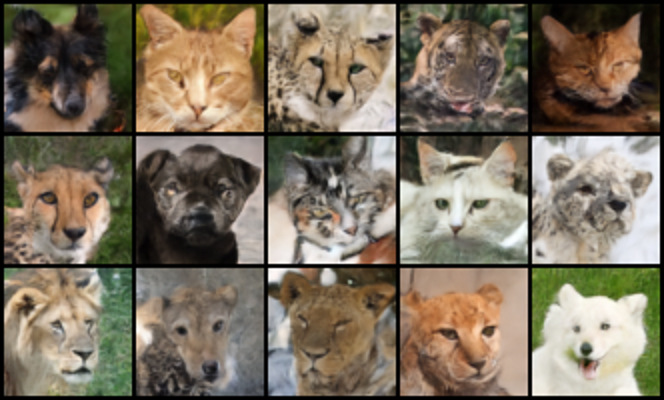

Running epoch 60


100%|██████████| 448/448 [06:51<00:00,  1.09it/s]


Finished epoch 60 with loss 0.07340899930568412
Running epoch 61


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 61 with loss 0.0724220451333427
Running epoch 62


100%|██████████| 448/448 [07:02<00:00,  1.06it/s]


Finished epoch 62 with loss 0.07244561346513885
Running epoch 63


100%|██████████| 448/448 [06:55<00:00,  1.08it/s]


Finished epoch 63 with loss 0.07310447020323149
Running epoch 64


100%|██████████| 448/448 [07:02<00:00,  1.06it/s]


Finished epoch 64 with loss 0.07264546353170383
Running epoch 65


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 65 with loss 0.0724613777378441
Running epoch 66


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 66 with loss 0.07305763261060097
Running epoch 67


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 67 with loss 0.0726759291802799
Running epoch 68


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 68 with loss 0.07276836119958066
Running epoch 69


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 69 with loss 0.07263098808471113


1000it [01:22, 12.19it/s]


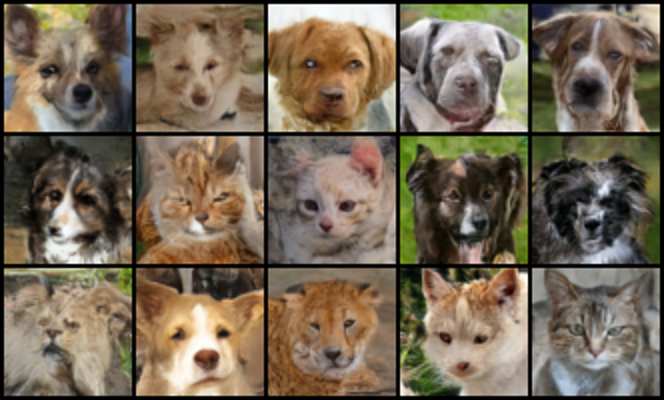

Running epoch 70


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 70 with loss 0.07232569335194837
Running epoch 71


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 71 with loss 0.0725853314673129
Running epoch 72


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 72 with loss 0.07187963182306183
Running epoch 73


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 73 with loss 0.07283125791998048
Running epoch 74


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 74 with loss 0.07164355325013665
Running epoch 75


100%|██████████| 448/448 [06:54<00:00,  1.08it/s]


Finished epoch 75 with loss 0.07215760453670685
Running epoch 76


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 76 with loss 0.07236242977004233
Running epoch 77


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 77 with loss 0.0718055435073828
Running epoch 78


100%|██████████| 448/448 [06:55<00:00,  1.08it/s]


Finished epoch 78 with loss 0.07268678540796307
Running epoch 79


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 79 with loss 0.07211778539931402


1000it [01:21, 12.28it/s]


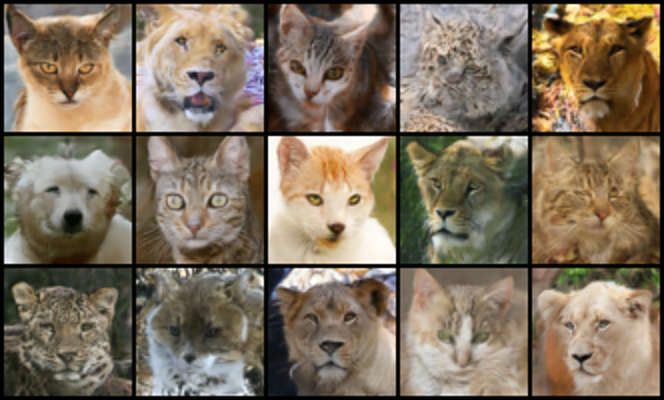

Running epoch 80


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 80 with loss 0.07226217474089935
Running epoch 81


100%|██████████| 448/448 [07:02<00:00,  1.06it/s]


Finished epoch 81 with loss 0.07164869659547028
Running epoch 82


100%|██████████| 448/448 [07:02<00:00,  1.06it/s]


Finished epoch 82 with loss 0.0720746359189174
Running epoch 83


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 83 with loss 0.07195744909612196
Running epoch 84


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 84 with loss 0.07160543464124203
Running epoch 85


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 85 with loss 0.07262495427858084
Running epoch 86


100%|██████████| 448/448 [06:57<00:00,  1.07it/s]


Finished epoch 86 with loss 0.07102468749508262
Running epoch 87


100%|██████████| 448/448 [06:55<00:00,  1.08it/s]


Finished epoch 87 with loss 0.07104759375631277
Running epoch 88


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 88 with loss 0.07167654408008925
Running epoch 89


100%|██████████| 448/448 [06:56<00:00,  1.07it/s]


Finished epoch 89 with loss 0.07119621489463109


1000it [01:21, 12.22it/s]


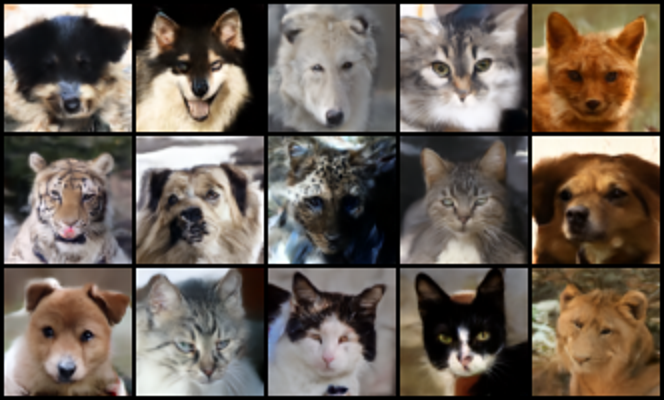

Running epoch 90


100%|██████████| 448/448 [07:00<00:00,  1.06it/s]


Finished epoch 90 with loss 0.0716600060778936
Running epoch 91


100%|██████████| 448/448 [06:56<00:00,  1.08it/s]


Finished epoch 91 with loss 0.07111046482376489
Running epoch 92


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 92 with loss 0.07173853175481781
Running epoch 93


100%|██████████| 448/448 [07:00<00:00,  1.07it/s]


Finished epoch 93 with loss 0.07131073591465663
Running epoch 94


100%|██████████| 448/448 [06:58<00:00,  1.07it/s]


Finished epoch 94 with loss 0.07202790295871507
Running epoch 95


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 95 with loss 0.07184840775361019
Running epoch 96


100%|██████████| 448/448 [06:56<00:00,  1.08it/s]


Finished epoch 96 with loss 0.07161333955757852
Running epoch 97


100%|██████████| 448/448 [07:02<00:00,  1.06it/s]


Finished epoch 97 with loss 0.0707814111208011
Running epoch 98


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 98 with loss 0.07111692976572417
Running epoch 99


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 99 with loss 0.07140763730110068


1000it [01:21, 12.21it/s]


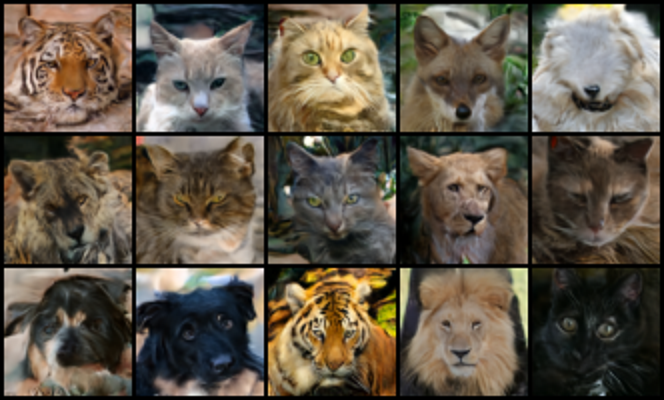

Running epoch 100


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 100 with loss 0.07107514982011967
Running epoch 101


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 101 with loss 0.0705445319680231
Running epoch 102


100%|██████████| 448/448 [06:54<00:00,  1.08it/s]


Finished epoch 102 with loss 0.07141574181150645
Running epoch 103


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 103 with loss 0.07122548874966535
Running epoch 104


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 104 with loss 0.07134557145348351
Running epoch 105


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 105 with loss 0.07041654866355072
Running epoch 106


100%|██████████| 448/448 [06:57<00:00,  1.07it/s]


Finished epoch 106 with loss 0.07098272164252453
Running epoch 107


100%|██████████| 448/448 [07:01<00:00,  1.06it/s]


Finished epoch 107 with loss 0.07085903773051021
Running epoch 108


100%|██████████| 448/448 [06:59<00:00,  1.07it/s]


Finished epoch 108 with loss 0.07123469448249255
Running epoch 109


100%|██████████| 448/448 [06:20<00:00,  1.18it/s]


Finished epoch 109 with loss 0.07070856003390093


1000it [01:11, 14.06it/s]


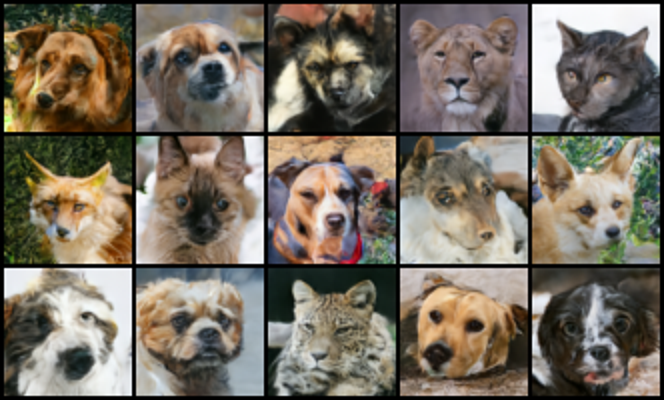

Running epoch 110


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 110 with loss 0.07175364475863587
Running epoch 111


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 111 with loss 0.0705250193797318
Running epoch 112


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 112 with loss 0.07068240974331275
Running epoch 113


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 113 with loss 0.07054987067489751
Running epoch 114


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 114 with loss 0.07113808684516698
Running epoch 115


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 115 with loss 0.07101084096523534
Running epoch 116


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 116 with loss 0.07043306412275083
Running epoch 117


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 117 with loss 0.07139308964334694
Running epoch 118


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 118 with loss 0.07086422317661345
Running epoch 119


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 119 with loss 0.0707389571387986


1000it [01:11, 14.06it/s]


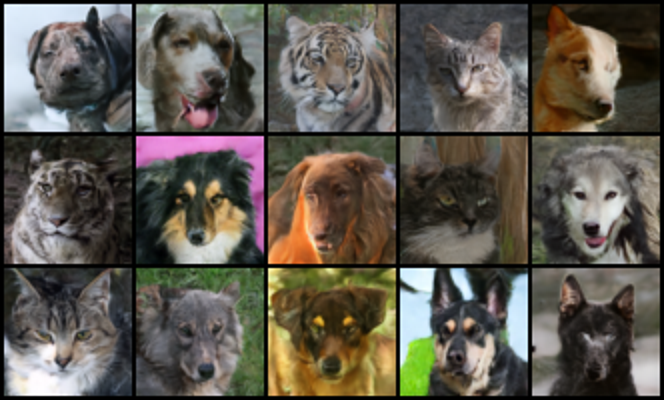

Running epoch 120


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 120 with loss 0.07064359524520114
Running epoch 121


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 121 with loss 0.07115406840707042
Running epoch 122


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 122 with loss 0.07110216836112418
Running epoch 123


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 123 with loss 0.07044998463243246
Running epoch 124


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 124 with loss 0.07046233778653134
Running epoch 125


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 125 with loss 0.07048740952242431
Running epoch 126


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 126 with loss 0.06993772551816489
Running epoch 127


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 127 with loss 0.07059057037778464
Running epoch 128


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 128 with loss 0.0709882402027558
Running epoch 129


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 129 with loss 0.07127264770679176


1000it [01:10, 14.09it/s]


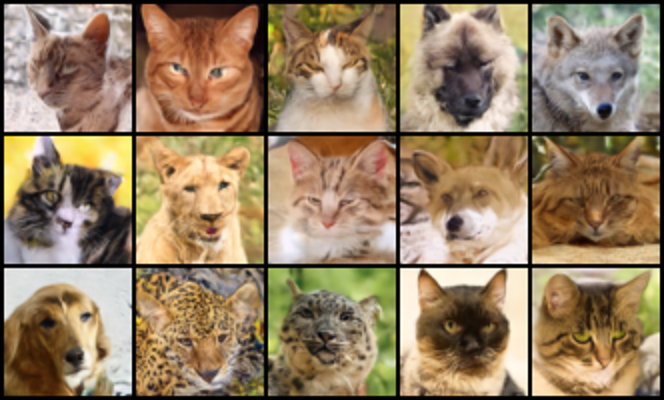

Running epoch 130


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 130 with loss 0.07024918275419623
Running epoch 131


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 131 with loss 0.07022270608493793
Running epoch 132


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 132 with loss 0.07035749441378616
Running epoch 133


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 133 with loss 0.07074568662626136
Running epoch 134


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 134 with loss 0.07099854013982362
Running epoch 135


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 135 with loss 0.07058881727113787
Running epoch 136


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 136 with loss 0.07113251332858843
Running epoch 137


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 137 with loss 0.07021653391088226
Running epoch 138


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 138 with loss 0.06993214840102675
Running epoch 139


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 139 with loss 0.07073987417555015


1000it [01:11, 14.07it/s]


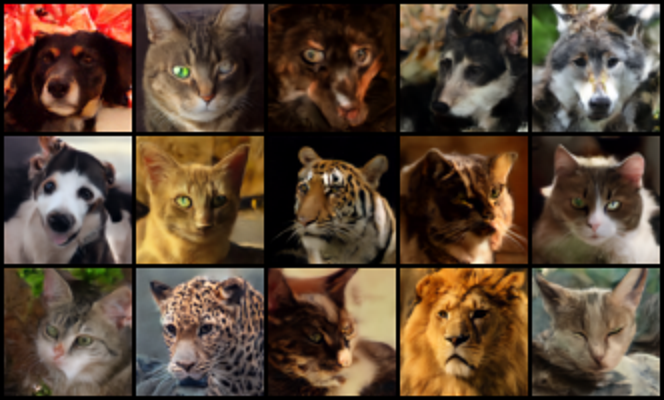

Running epoch 140


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 140 with loss 0.07009638004404094
Running epoch 141


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 141 with loss 0.06992263702808746
Running epoch 142


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 142 with loss 0.0703088948752598
Running epoch 143


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 143 with loss 0.0694040602372427
Running epoch 144


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 144 with loss 0.07061121635238773
Running epoch 145


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 145 with loss 0.07038851940472211
Running epoch 146


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 146 with loss 0.0709956950657735
Running epoch 147


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 147 with loss 0.06963710999947839
Running epoch 148


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 148 with loss 0.06990909952271197
Running epoch 149


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 149 with loss 0.06980671894936157


1000it [01:11, 14.05it/s]


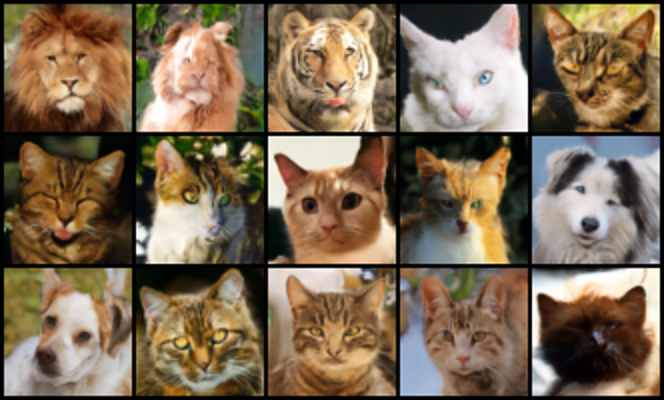

Running epoch 150


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 150 with loss 0.07005524355086631
Running epoch 151


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 151 with loss 0.07022764376597479
Running epoch 152


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 152 with loss 0.0697832897006135
Running epoch 153


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 153 with loss 0.07048446670939613
Running epoch 154


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 154 with loss 0.06984840330967147
Running epoch 155


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 155 with loss 0.07016987355226385
Running epoch 156


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 156 with loss 0.07024614764044859
Running epoch 157


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 157 with loss 0.0702520868591299
Running epoch 158


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 158 with loss 0.07038064457343093
Running epoch 159


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 159 with loss 0.07033584676017719


1000it [01:11, 14.07it/s]


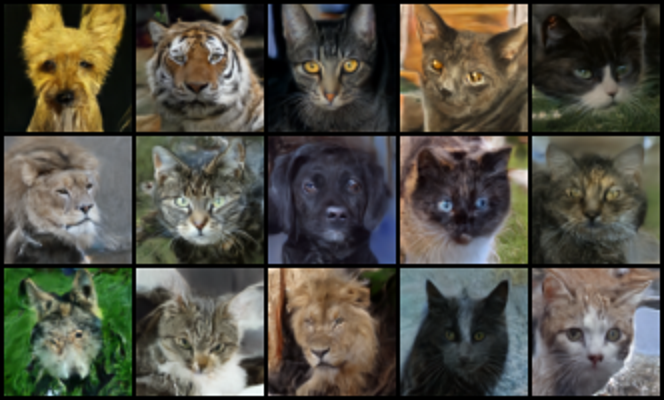

Running epoch 160


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 160 with loss 0.06971376912302471
Running epoch 161


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 161 with loss 0.07014831859851256
Running epoch 162


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 162 with loss 0.0700165585398541
Running epoch 163


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 163 with loss 0.07021299435291439
Running epoch 164


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 164 with loss 0.0704846303560771
Running epoch 165


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 165 with loss 0.07041209582738313
Running epoch 166


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 166 with loss 0.07030087042533394
Running epoch 167


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 167 with loss 0.06966092595497944
Running epoch 168


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 168 with loss 0.06971442711073905
Running epoch 169


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 169 with loss 0.07064738689223304


1000it [01:11, 14.07it/s]


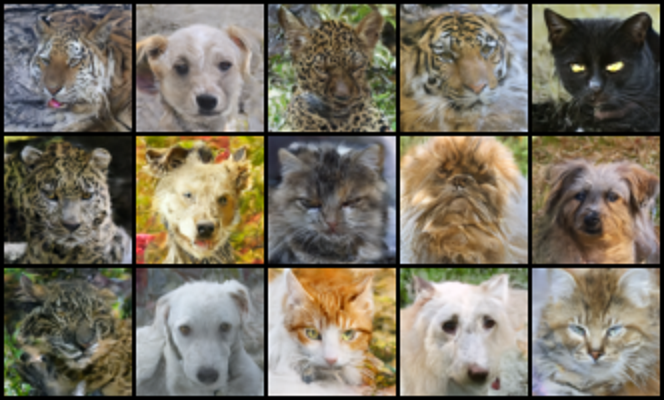

Running epoch 170


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 170 with loss 0.07030407075736937
Running epoch 171


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 171 with loss 0.0701440309307405
Running epoch 172


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 172 with loss 0.06948568124789745
Running epoch 173


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 173 with loss 0.06958257815235161
Running epoch 174


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 174 with loss 0.07004516642440908
Running epoch 175


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 175 with loss 0.06930591727307599
Running epoch 176


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 176 with loss 0.06910233310190961
Running epoch 177


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 177 with loss 0.06975341618194111
Running epoch 178


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 178 with loss 0.06974227781341012
Running epoch 179


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 179 with loss 0.06983413737699655


1000it [01:11, 14.05it/s]


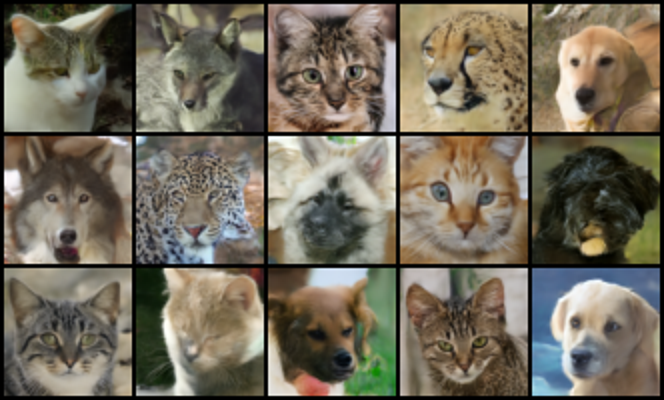

Running epoch 180


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 180 with loss 0.06961926201724314
Running epoch 181


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 181 with loss 0.06992273608921096
Running epoch 182


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 182 with loss 0.07013301094827641
Running epoch 183


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 183 with loss 0.06961434321211916
Running epoch 184


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 184 with loss 0.06870507472194731
Running epoch 185


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 185 with loss 0.07010198939990785
Running epoch 186


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 186 with loss 0.06913682877451979
Running epoch 187


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 187 with loss 0.06905719643691555
Running epoch 188


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 188 with loss 0.07016834465321153
Running epoch 189


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 189 with loss 0.06976394198967942


1000it [01:11, 14.07it/s]


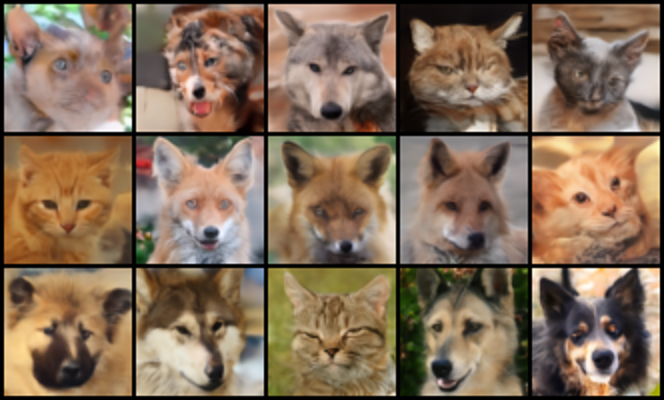

Running epoch 190


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 190 with loss 0.06927153323444404
Running epoch 191


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 191 with loss 0.06918318880655404
Running epoch 192


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 192 with loss 0.06969918919328068
Running epoch 193


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 193 with loss 0.07016316578457397
Running epoch 194


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 194 with loss 0.07006937467459855
Running epoch 195


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 195 with loss 0.06960846751462668
Running epoch 196


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 196 with loss 0.06883001715011362
Running epoch 197


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 197 with loss 0.06938752672535234
Running epoch 198


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 198 with loss 0.06977101244098906
Running epoch 199


100%|██████████| 448/448 [06:07<00:00,  1.22it/s]


Finished epoch 199 with loss 0.06993315412962277


1000it [01:11, 14.08it/s]


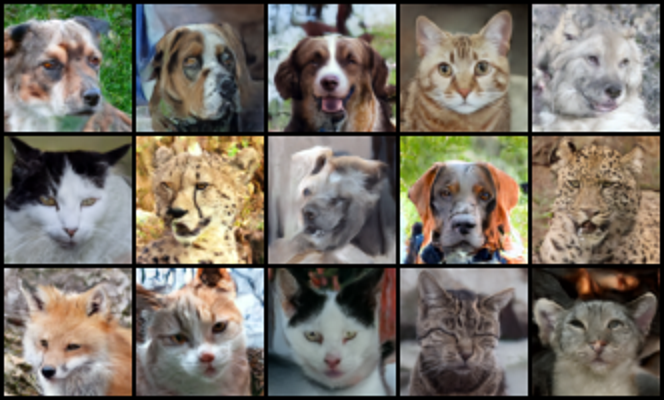

In [18]:
# Training cycle
for epoch_idx in range(hyperparams["num_epochs"]):
    losses = []
    print(f"Running epoch {epoch_idx}")
    for img in tqdm(dataloader):
        optimizer.zero_grad()

        # Input image and noise
        img = img.float().to(DEVICE)
        noise = torch.randn_like(img).to(DEVICE)

        # Sample timestep
        t_step = torch.randint(0, hyperparams["num_steps"], (img.shape[0],)).to(DEVICE)

        # Ground truth: either noise or v target
        if hyperparams["v_prediction"]:
            gt = diffusion_manager.v_prediction_target(img, t_step, noise).to(DEVICE).float()
        else:
            gt = noise

        # Add noise to image according to time step
        img_noisy = diffusion_manager.forward_process(img, t_step, noise)

        # Get noise prediction
        with (
            torch.autocast(device_type="cuda", dtype=torch.float16)
            if hyperparams["mixed_precision"]
            else nullcontext()
        ):
            pred = model.forward(img_noisy, t_step)
            loss = criterion(pred, gt)

        # Loss
        losses.append(loss.item())
        if hyperparams["mixed_precision"]:
            scaler.scale(loss).backward()
        else:
            loss.backward()

        # Gradient clipping to stabilize training
        if hyperparams["clip_gradients"]:
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Optimizer step
        if hyperparams["mixed_precision"]:
            scaler.step(optimizer)
            scaler.update()
        else:
            optimizer.step()

    avg_epoch_losses.append(np.mean(losses))
    print(f"Finished epoch {epoch_idx} with loss {avg_epoch_losses[-1]}")

    # Sample images in some key epochs
    if (epoch_idx + 1) % 10 == 0:
        model.eval()
        sample(model, config)
        model.train()

In [ ]:
# Check if output dir exists
# Save weights
dt = datetime.now()
stamp = f"{dt.day}-{dt.month}-{dt.year}_{dt.hour}_{dt.minute}_{dt.second}"
torch.save(model.state_dict(), create_missing_dirs(os.path.join(config["weights"], f"weights_{stamp}.pth")))

# Show loss progression

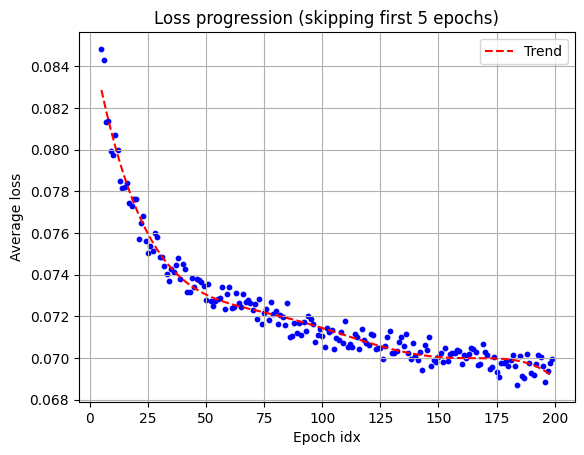

In [ ]:
# Create x values as indices
start_id = 5
x = np.array(range(start_id, len(avg_epoch_losses)))
y = np.array(avg_epoch_losses[start_id:])

# Scatter plot of original points
plt.scatter(x, y, color='blue', s=10)

# Interpolation
z = np.polyfit(x, y, 5)
p = np.poly1d(z)

# Dashed interpolated line
plt.plot(x,p(x), 'r--', label='Trend')

# Labels and legend
plt.xlabel("Epoch idx")
plt.ylabel("Average loss")
plt.title(f"Loss progression (skipping first {start_id} epochs)")
plt.legend()
plt.grid(True)
plt.savefig(create_missing_dirs(os.path.join(config["plots"], f"loss_plot_{stamp}.jpg")))
plt.show()